
# Topological Plasma Simulation

This Colab notebook simulates a simplified topological plasma structure using:
- A **resonant core** (with high-frequency oscillation)
- A **tornado shell** (rotating absorption layer)
- An **outer cloud layer** (where damping occurs)

The simulation visualizes how particles interact in these zones over time.

---


In [1]:

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

grid_size = 100
num_particles = 5000
steps = 200
dt = 0.1

np.random.seed(42)
x = np.random.normal(loc=grid_size/2, scale=10, size=num_particles)
y = np.random.normal(loc=grid_size/2, scale=10, size=num_particles)

vx = -(y - grid_size/2) * 0.05
vy =  (x - grid_size/2) * 0.05

positions = []

core_radius = 10
cloud_radius = 40

for _ in range(steps):
    r = np.sqrt((x - grid_size/2)**2 + (y - grid_size/2)**2)

    resonance_zone = r < core_radius
    vx[resonance_zone] *= 1.02
    vy[resonance_zone] *= 1.02

    damping_zone = r > cloud_radius
    vx[damping_zone] *= 0.95
    vy[damping_zone] *= 0.95

    x += vx * dt
    y += vy * dt

    positions.append((x.copy(), y.copy()))


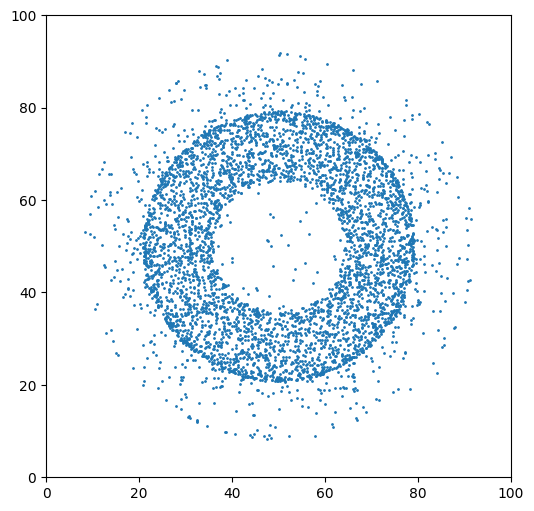

In [2]:

fig, ax = plt.subplots(figsize=(6, 6))
scat = ax.scatter([], [], s=1)

def init():
    ax.set_xlim(0, grid_size)
    ax.set_ylim(0, grid_size)
    return scat,

def update(frame):
    xdata, ydata = positions[frame]
    scat.set_offsets(np.c_[xdata, ydata])
    return scat,

ani = animation.FuncAnimation(fig, update, frames=steps, init_func=init, blit=True)
from IPython.display import HTML
HTML(ani.to_jshtml())
